# Patel SMQ2 EryA analysis
## Xiaonan Wang
## 04May2020

This is to analysis the EryA data

In [1]:
#%matplotlib nbagg
import numpy as np
import matplotlib.pyplot as plt
import scanpy as sc
import pandas as pd
import os
import smqpp
import re
import anndata

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()

from matplotlib.colors import LinearSegmentedColormap
cmap = LinearSegmentedColormap.from_list(name='gene_cmap', colors=['lightgrey', 'thistle', 'red', 'darkred']) 

sc.settings.set_figure_params(dpi=80, color_map='viridis', vector_friendly=False,  dpi_save=300)

/home/xw251/miniconda3/envs/scanpy_py368/lib/python3.6/site-packages/anndata/_core/anndata.py:21: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex


scanpy==1.4.6 anndata==0.7.1 umap==0.4.1 numpy==1.18.2 scipy==1.4.1 pandas==1.0.3 scikit-learn==0.22.2.post1 statsmodels==0.11.1 python-igraph==0.8.0 louvain==0.6.1


# Main analysis
# Read in data and normalise

In [2]:
adata = sc.read('./write/patel_smq2_EryA_raw.h5ad')

In [3]:
sc.pp.filter_genes(adata, min_cells=1)

filtered out 12028 genes that are detected in less than 1 cells


In [4]:
smqpp.normalise_data(adata)

Calculate SF for genes:
Filtered matrix shape: (1152, 61)
Number of valid means:61
Calculate SF for erccs:
Filtered matrix shape: (1152, 15)
Number of valid means:15


In [5]:
adata.raw = adata

In [6]:
adata.write('./write/patel_smq2_EryA_lognorm.h5ad')

# Select Highly Variable Genes

In [7]:
adata = sc.read('./write/patel_smq2_EryA_lognorm.h5ad')

In [8]:
smqpp.tech_var(adata, useERCC=True) 

31
Length of HVGs: 7536


/home/xw251/miniconda3/envs/scanpy_py368/lib/python3.6/site-packages/smqpp/__init__.py:290: RuntimeWarning: invalid value encountered in true_divide
  cv2s = (sStd/sMean)**2
/home/xw251/miniconda3/envs/scanpy_py368/lib/python3.6/site-packages/smqpp/__init__.py:295: RuntimeWarning: invalid value encountered in greater
  meanForFit = np.quantile(sMean[cv2s>cvThresh], quant)
/home/xw251/miniconda3/envs/scanpy_py368/lib/python3.6/site-packages/statsmodels/genmod/generalized_linear_model.py:278: DomainWarning: The identity link function does not respect the domain of the Gamma family.
  DomainWarning)


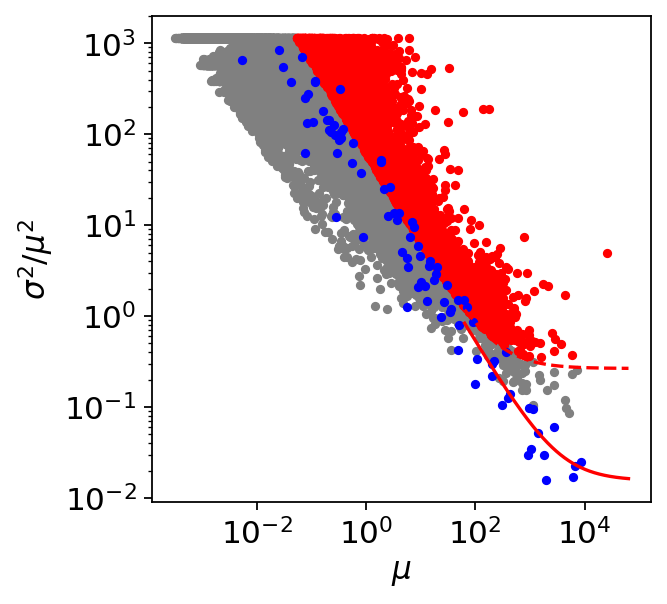

In [11]:
smqpp.plot_tech_var(adata)

In [12]:
adata.shape

(1152, 19025)

In [13]:
adata = adata[:,adata.uns['varGenes']['genes']['highVar']].copy()

In [14]:
adata.shape

(1152, 7536)

In [15]:
# scale for pca
sc.pp.scale(adata)

# Visualisation

computing PCA with n_comps = 50
    finished (0:00:00)


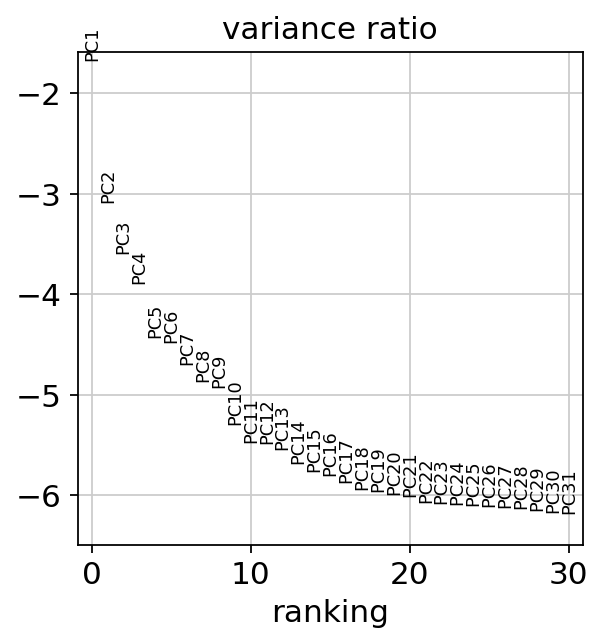

In [16]:
# Try different visualisations
sc.tl.pca(adata, svd_solver='arpack')
sc.pl.pca_variance_ratio(adata, log=True)

In [17]:
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.tsne(adata)
sc.tl.draw_graph(adata)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)
computing tSNE
    using 'X_pca' with n_pcs = 50
    using the 'MulticoreTSNE' package by Ulyanov (2017)
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:06)
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:03)


In [18]:
keys2plot = ['batch', 'n_counts', 'n_genes', 'doublet_score', 'phase',  'Cell_type_general', 'Sex', 'Cond1']

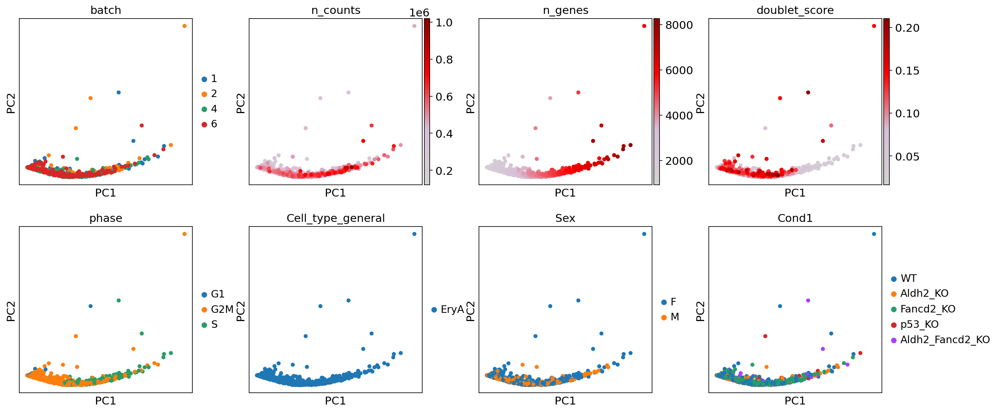

In [19]:
sc.pl.pca_scatter(adata, color=keys2plot, color_map=cmap)

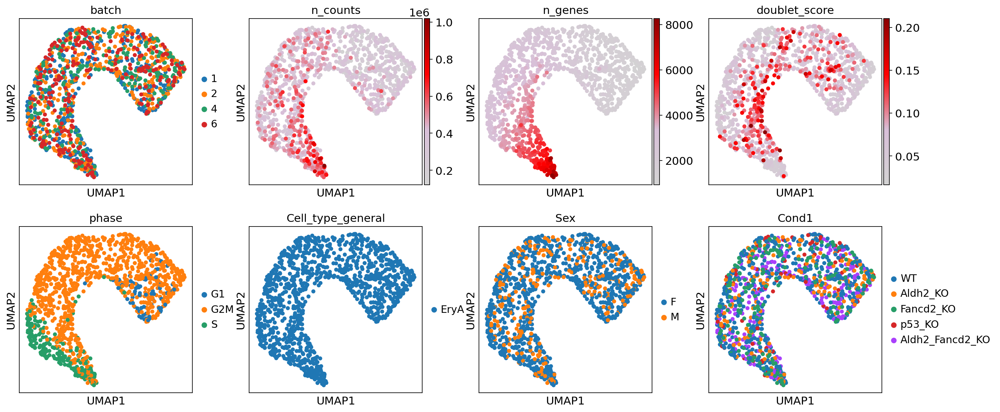

In [20]:
sc.pl.umap(adata, color=keys2plot, color_map=cmap)

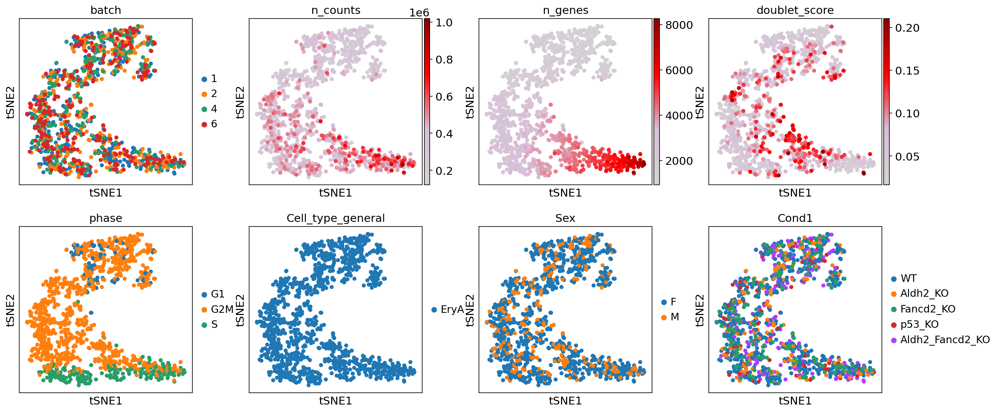

In [21]:
sc.pl.tsne(adata, color=keys2plot, color_map=cmap)

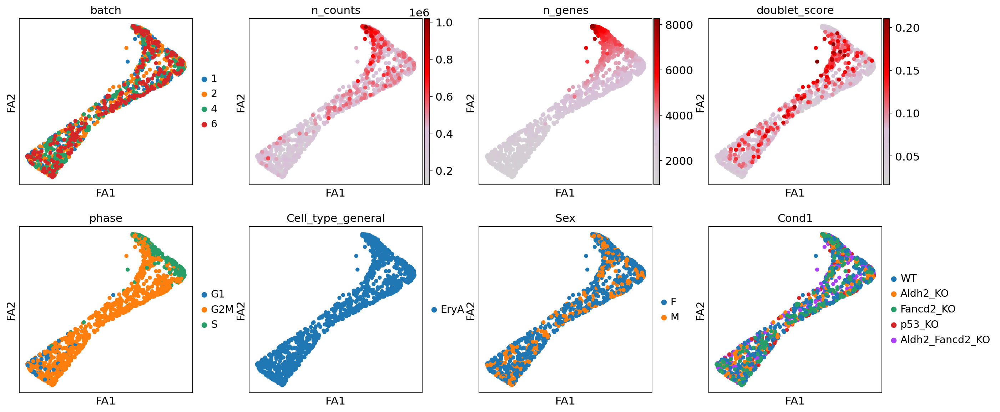

In [22]:
sc.pl.draw_graph(adata, color=keys2plot, color_map=cmap)

# Check cell cycle

In [23]:
tab1 = pd.crosstab(adata.obs['phase'], adata.obs['Cond1'], normalize=1)*100

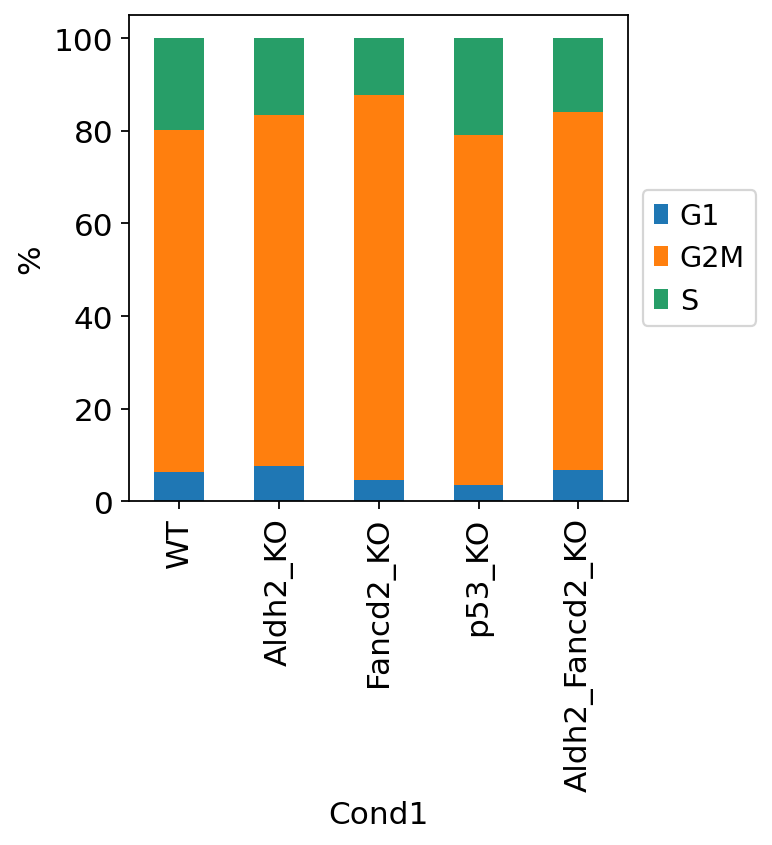

In [24]:
# Quickly have a look at the proportion
ax = tab1.T.plot.bar(stacked=True)
ax.grid(False)
ax.set_ylabel('%')
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

In [25]:
adata.write('./write/patel_smq2_EryA_processed.h5ad')

# Regress out cell cycle effect and Number of genes

In [77]:
adata = sc.read('./write/patel_smq2_EryA_processed.h5ad')

In [78]:
# regress out cell cycle effect
sc.pp.regress_out(adata, ['S_score', 'G2M_score', 'n_genes'])
sc.pp.scale(adata)

regressing out ['S_score', 'G2M_score', 'n_genes']
    finished (0:00:22)


In [79]:
# Repeat the pipeline again
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.tsne(adata)
sc.tl.draw_graph(adata)

computing PCA with n_comps = 50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)
computing tSNE
    using 'X_pca' with n_pcs = 50
    using the 'MulticoreTSNE' package by Ulyanov (2017)
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:06)
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:04)


In [80]:
# save another oject as regressed out
adata.write('./write/patel_smq2_EryA_processed_regressout_cellcycle.h5ad')

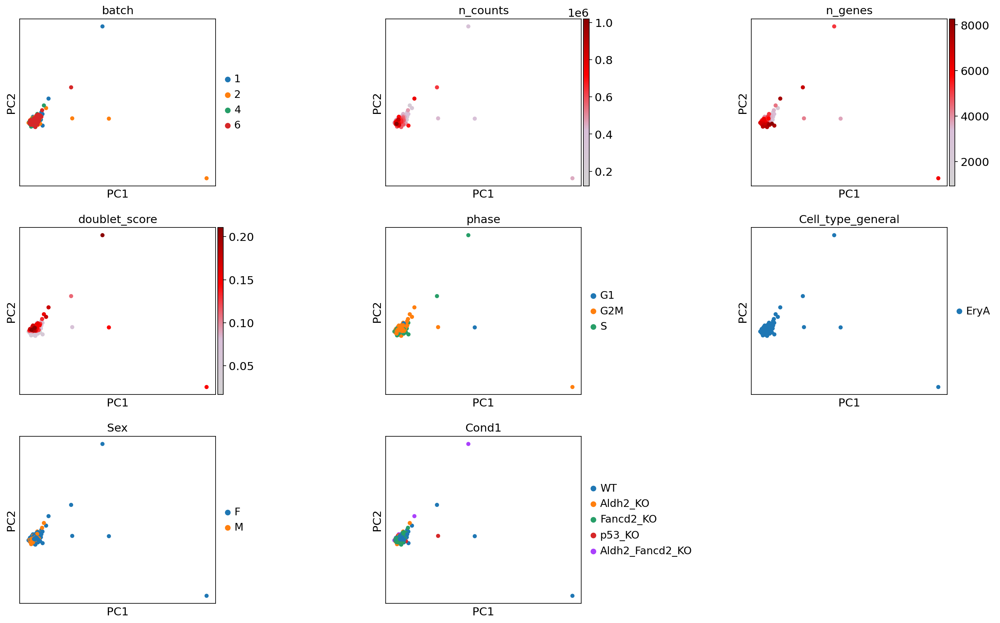

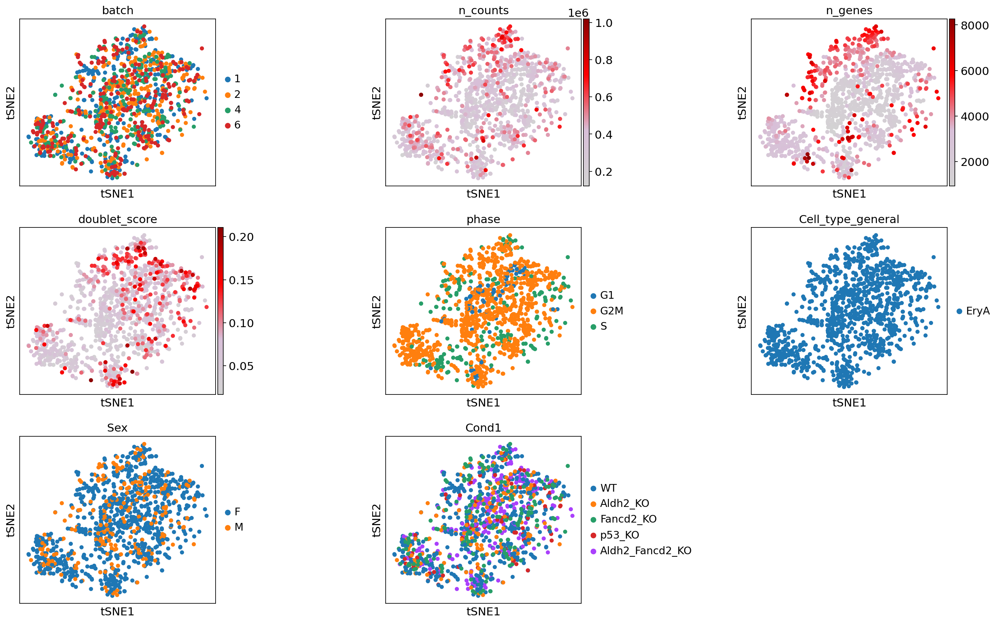

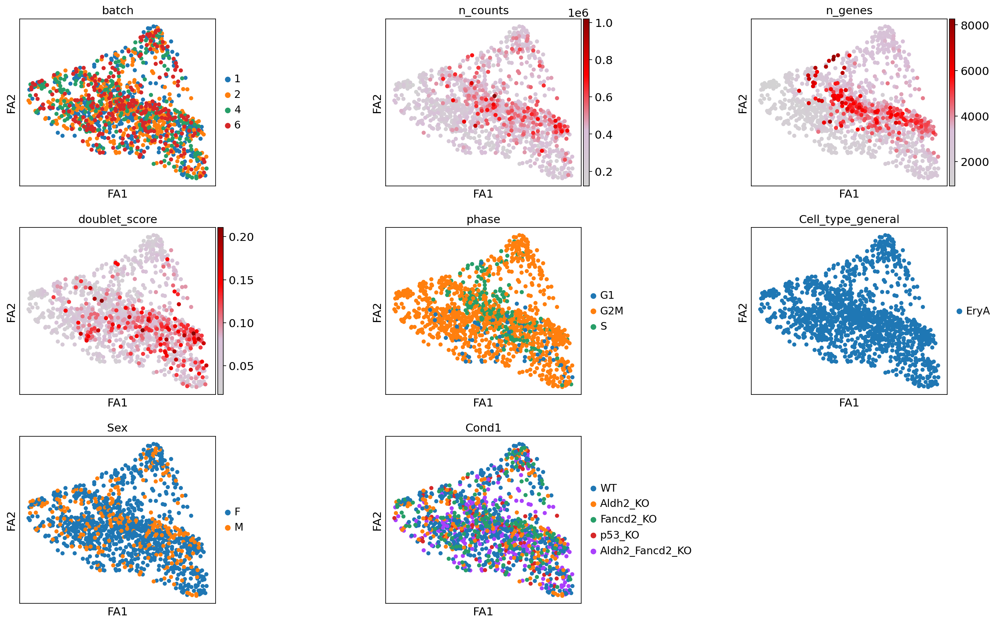

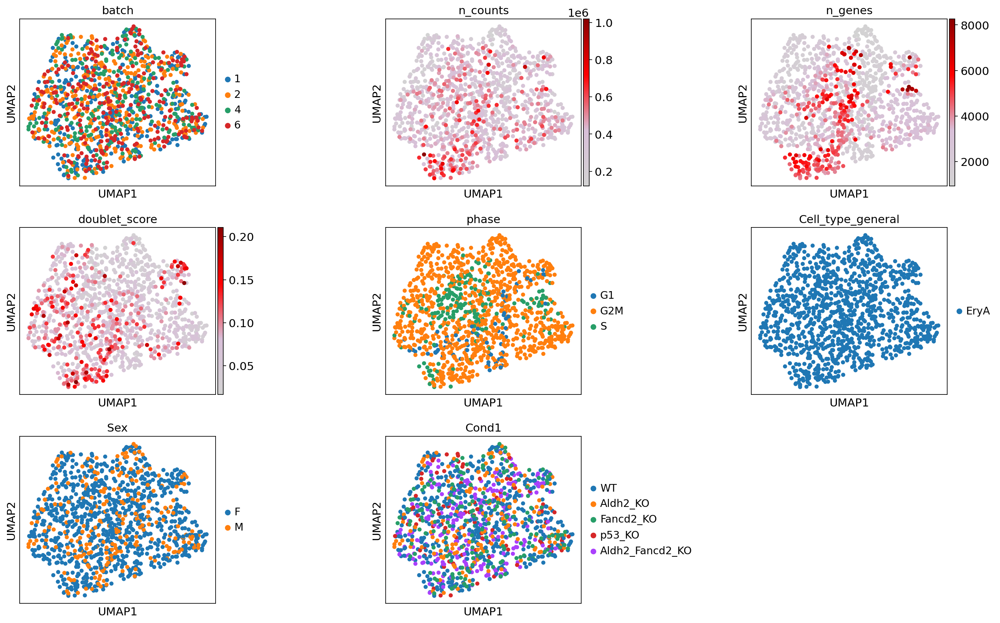

In [81]:
# plot and see
sc.pl.pca(adata, color=keys2plot, wspace=0.7, ncols=3, color_map=cmap)
sc.pl.tsne(adata, color=keys2plot, wspace=0.7, ncols=3, color_map=cmap)
sc.pl.draw_graph(adata, color=keys2plot, wspace=0.7, ncols=3, color_map=cmap)
sc.pl.umap(adata, color=keys2plot, wspace=0.7, ncols=3, color_map=cmap)

# Clustering

In [82]:
# louvain clustering
sc.tl.louvain(adata, resolution = 0.5, random_state=0, key_added='louvain_v2')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 6 clusters and added
    'louvain_v2', the cluster labels (adata.obs, categorical) (0:00:00)


In [83]:
# Fernando will ask for rename the clusters starting from 1 rather than 0
adata.obs['louvain_v2'] = adata.obs['louvain_v2'].astype('category')
adata.obs['louvain_v2'] = adata.obs['louvain_v2'].cat.rename_categories([str(int(x)+1) for x in adata.obs['louvain_v2'].cat.categories])

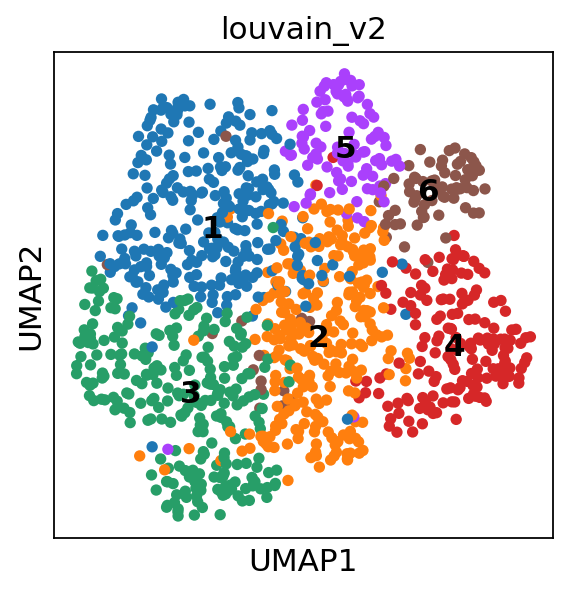

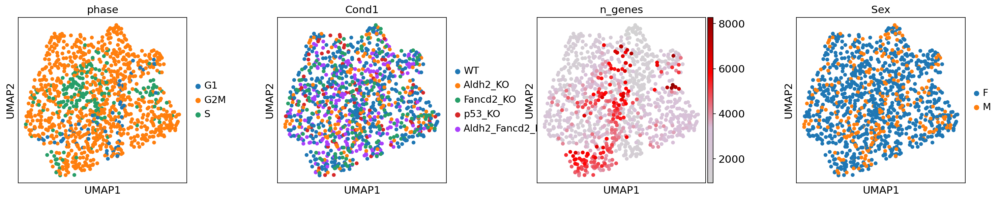

In [84]:
sc.pl.umap(adata, color=['louvain_v2'], legend_loc='on data')
sc.pl.umap(adata, color=[ 'phase', 'Cond1', 'n_genes', 'Sex'], wspace=0.4, color_map=cmap, legend_loc='right margin')

In [85]:
from collections import defaultdict

GeneMarkers =defaultdict(list)
#GeneMarkers['HSCs_M'] = ['Procr',  'Hoxb5']
#GeneMarkers['Lym_M'] = ['Dntt', 'Flt3', 'Rag2']
#GeneMarkers['Mega_M'] = ['Pf4', 'Itga2b', 'Gp1bb']
GeneMarkers['Ery_M'] = ['Klf1', 'Epor', 'Gata1']
GeneMarkers['Neu_M'] = ['Elane', 'Gfi1', 'Cebpe']
GeneMarkers['Mono_M'] = ['Irf8', 'Csf1r', 'Ly86']
#GeneMarkers['Eosi_M'] = ['Prg2', 'Prg3']
#GeneMarkers['MC_M'] = ['Gzmb', 'Cma1']
#GeneMarkers['Baso_M'] = ['Prss34', 'Mcpt8']
#GeneMarkers['DC_M'] = ['Fcer1a']
GeneMarkers['Tcells_M'] = ['Cd3d', 'Cd4', 'Cd8a']
#GeneMarkers['NK_M'] = ['Nkg7']
GeneMarkers['Bcells_M'] = ['Cd79a']

Erythroid progenitor


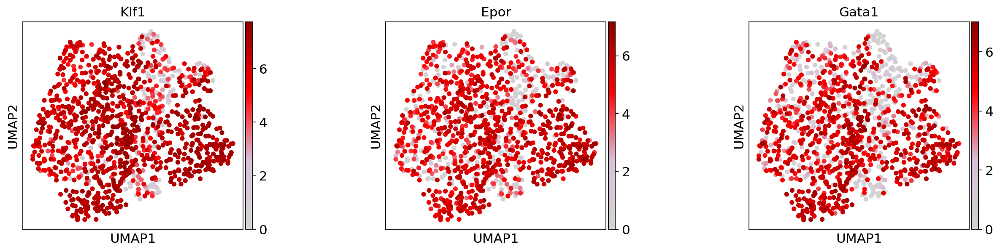

Neutrophil progenitor


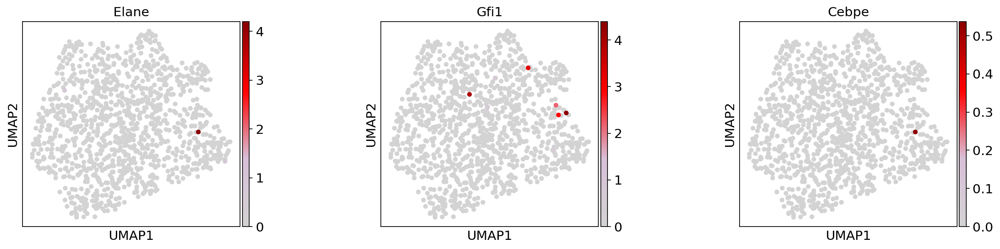

Monocyte progenitor


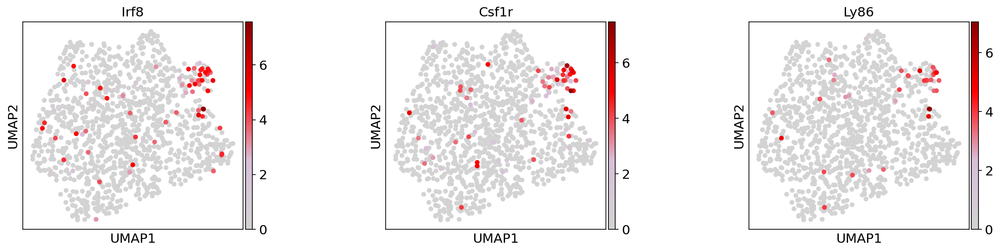

Tcells


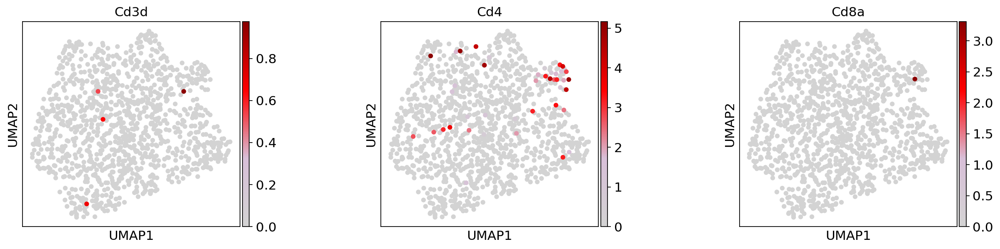

B cells


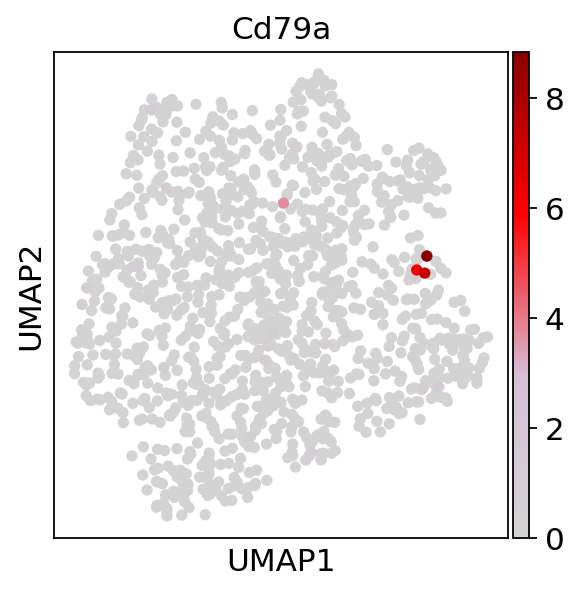

In [86]:
#print('HSC')
#sc.pl.umap(adata, color=GeneMarkers['HSCs_M'], wspace=0.5, legend_loc='on data', color_map=cmap)
#print('Lymphoid progenitor')
#sc.pl.umap(adata, color=GeneMarkers['Lym_M'], wspace=0.5, legend_loc='on data', color_map=cmap)
#print('Megakaryocyte progenitor')
#sc.pl.umap(adata, color=GeneMarkers['Mega_M'], wspace=0.5, legend_loc='on data', color_map=cmap)
print('Erythroid progenitor')
sc.pl.umap(adata, color=GeneMarkers['Ery_M'], wspace=0.5, legend_loc='on data', color_map=cmap)
print('Neutrophil progenitor')
sc.pl.umap(adata, color=GeneMarkers['Neu_M'], wspace=0.5, legend_loc='on data', color_map=cmap)
print('Monocyte progenitor')
sc.pl.umap(adata, color=GeneMarkers['Mono_M'], wspace=0.5, legend_loc='on data', color_map=cmap)
#print('Eosinophil progenitor')
#sc.pl.umap(adata, color=GeneMarkers['Eosi_M'], wspace=0.5, legend_loc='on data', color_map=cmap)
#print('Mast cell progenitor')
#sc.pl.umap(adata, color=GeneMarkers['MC_M'], wspace=0.5, legend_loc='on data', color_map=cmap)
#print('Basophil progenitor')
#sc.pl.umap(adata, color=GeneMarkers['Baso_M'], wspace=0.5, legend_loc='on data', color_map=cmap)
#print('Dendritic cell progenitor')
#sc.pl.umap(adata, color=GeneMarkers['DC_M'], wspace=0.5, legend_loc='on data', color_map=cmap)
print('Tcells')
sc.pl.umap(adata, color=GeneMarkers['Tcells_M'], wspace=0.5, legend_loc='on data', color_map=cmap)
#print('NK cells')
#sc.pl.umap(adata, color=GeneMarkers['NK_M'], wspace=0.5, legend_loc='on data', color_map=cmap)
print('B cells')
sc.pl.umap(adata, color=GeneMarkers['Bcells_M'], wspace=0.5, legend_loc='on data', color_map=cmap)

In [87]:
# save another oject as regressed out
adata.write('./write/patel_smq2_EryA_processed_regressout_cellcycle.h5ad')

[0, 3, 3, 3, 3, 1]
['Ery_M', 'Neu_M', 'Mono_M', 'Tcells_M', 'Bcells_M']


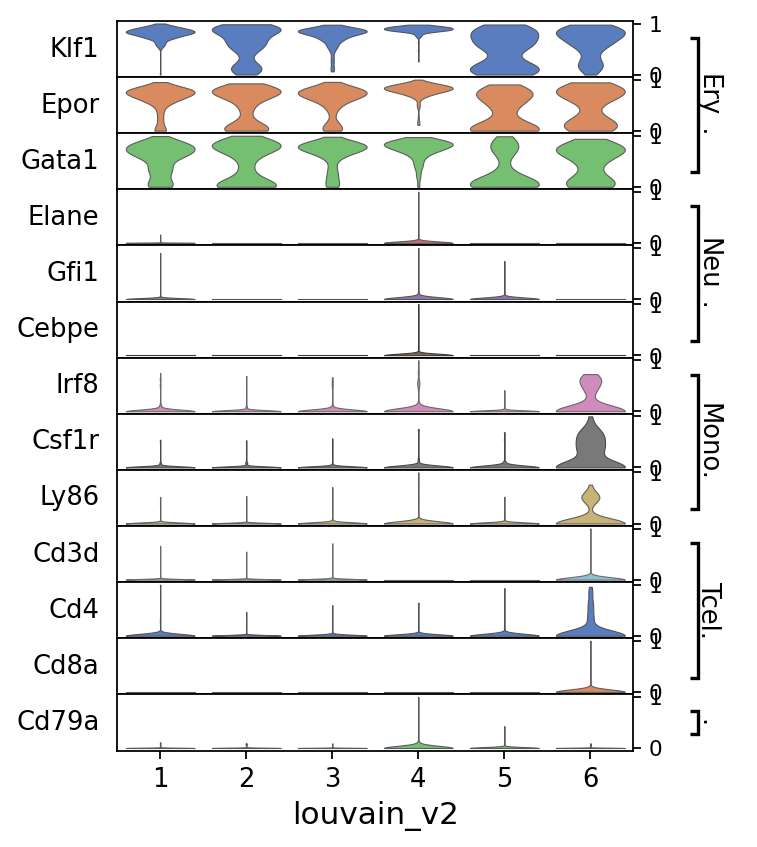

In [88]:
allMarkerGenes = sum(GeneMarkers.values(),[])
lenGL = [len(v) for v in GeneMarkers.values()]
lenGL = [0]+lenGL
print(lenGL)
gpos = [(sum(lenGL[:x]) ,sum(lenGL[:x+1])-1) for x in range(1,len(lenGL))]
print(list(GeneMarkers.keys()))

ax = sc.pl.stacked_violin(adata,allMarkerGenes, groupby='louvain_v2', dendrogram=False, swap_axes=True, standard_scale='var', cmap=cmap,
                var_group_positions = gpos,
                var_group_labels=list(GeneMarkers.keys()),figsize=(5,6),show_gene_labels=True)

In [89]:
# save another oject as regressed out
adata.write('./write/patel_smq2_EryA_processed_regressout_cellcycle.h5ad')

As these are EryA samples, so projection is not required.
In addition, HSC scores are not required, either.

# Check some genes

In [63]:
p53_targets = pd.read_excel('/home/xw251/rds/rds-bg200-hphi-gottgens/users/xw251/From_J_drive/backup/Nicola_patel/PMID27280975_Table S3 TP53 targets.xlsx')

In [64]:
p53_targets.head(3)

,ensembl ID,Gene Symbol,p53 Expression Score (-20..0..20),p53 ChIP ±2.5 kb from TSS sum (0..15),Confidence,Wei 2006 direct p53 target,Smeenk 2011 direct p53 target,Nikulenkov 2012 direct p53 target,Menendez 2013 direct p53 target,Schlereth 2013 direct p53 target,Allen 2014 direct p53 target,Chang 2014 direct p53 target,Riley 2008 direct p53 target
0,ENSG00000196072,BLOC1S2,20,15,****,NO,YES,YES,YES,YES,YES,YES,NO
1,ENSG00000124762,CDKN1A,20,15,****,YES,YES,YES,YES,YES,YES,YES,YES
2,ENSG00000080546,SESN1,20,15,****,NO,YES,YES,YES,NO,YES,NO,YES


In [65]:
# Only get the significant ones, 69 in total
p53_targets = p53_targets.loc[p53_targets['Confidence'] == '****',:]['Gene Symbol'].values
print(len(p53_targets))

69


In [66]:
# Overlap with expressed genes
p53_targets = adata.raw.var_names[np.in1d(np.array([x.upper() for x in adata.raw.var_names]), p53_targets)]
print(len(p53_targets))

57


(1152, 57)
(1152, 57)


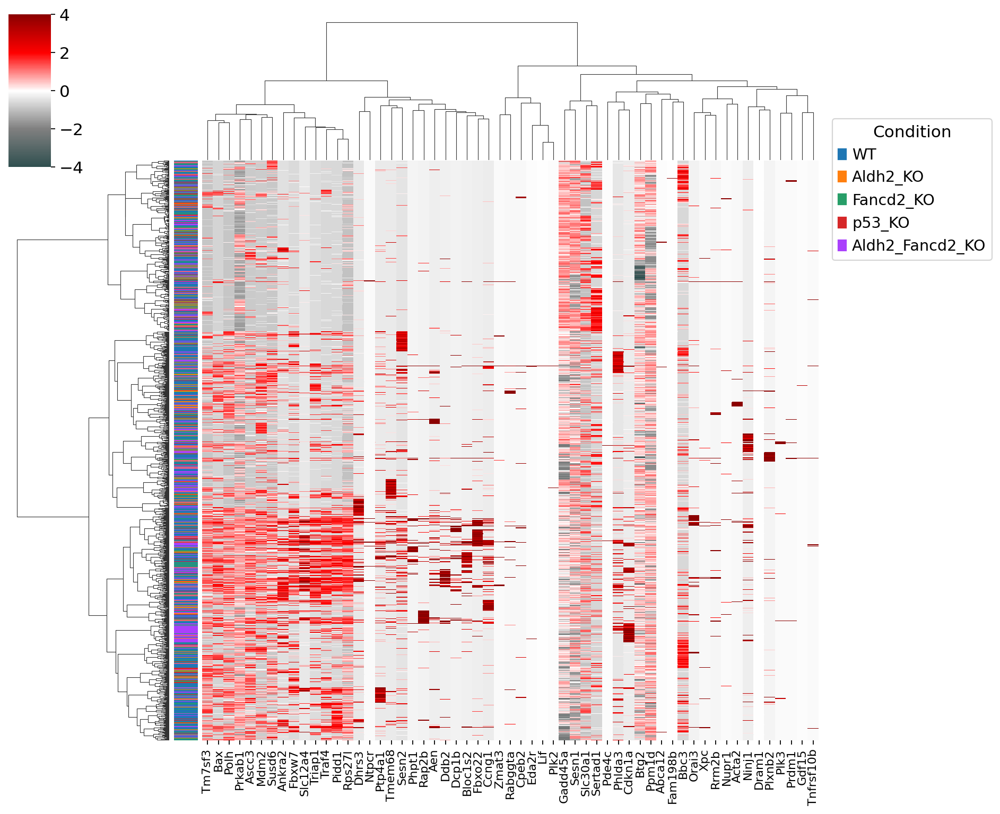

In [67]:
import seaborn as sns
import scipy.spatial as sp, scipy.cluster.hierarchy as hc

D_sub = pd.DataFrame(adata.raw[:,p53_targets].X)
D_sub.columns = p53_targets
D_sub.index = adata.obs_names
print(D_sub.shape)
D_sub = D_sub.loc[np.sum(D_sub, axis=1) > 0, np.sum(D_sub, axis=0) > 0]
print(D_sub.shape)

# try to normalise it by column
cmean = np.mean(D_sub,axis=0)
csd = np.std(D_sub,axis=0)
D_sub =D_sub.apply(lambda a: (a-cmean)/csd, axis=1)
D_sub[D_sub > 4] = 4
D_sub[D_sub < -4] = -4

c1 = D_sub.corr().values
c2 = D_sub.T.corr().values
c1_dist = sp.distance.squareform(1-c1)
c2_dist = sp.distance.squareform(1-c2)
h1 = hc.linkage(c1_dist, method='ward')
h2 = hc.linkage(c2_dist, method='ward')

row_colors = adata.obs['Cond1'].astype('category')
row_colors.name = 'Cond1'
cat = list(row_colors.cat.categories)
col = sc.pl.palettes.vega_20_scanpy[0:len(row_colors.cat.categories)]
my_palette = dict(zip(row_colors.cat.categories, col))
row_colors = row_colors.map(my_palette).values.astype('category')

cmap1 = LinearSegmentedColormap.from_list(name='heatmap_cmap', colors=['#2f4f4f', 'grey', 'white', 'red','#8b0000'])

import matplotlib.patches as mpatches
legend_TN = []
for i in range(len(cat)):
    legend_TN.append(mpatches.Patch(color=col[i], label=cat[i]))

g = sns.clustermap(D_sub, row_linkage=h2, col_linkage=h1, cmap=cmap1,yticklabels=False, xticklabels=True, row_colors=row_colors)
plt.setp(g.ax_heatmap.xaxis.get_majorticklabels(), fontsize=10)
g.ax_heatmap.set_ylabel("")

l1=g.ax_heatmap.legend(title='Condition', loc='center left',bbox_to_anchor=(1.01,0.95),handles=legend_TN,frameon=True)

No obvious clusters are found for key p53 downstream targets.

# Look at the Young/Old genes

In [68]:
adata = sc.read('./write/patel_smq2_EryA_processed_regressout_cellcycle.h5ad')

In [69]:
# Here is the overlap between the LT/ST/MPP between young and old
yoGL = pd.read_csv('/home/xw251/rds/rds-bg200-hphi-gottgens/users/xw251/Lab_Members/Niki/Patel_TenX/Analysis/yoGL_df_GSE100426.csv', index_col=0)
yoGL.head(3)

,GN,Age
1,A630089N07Rik,Young
2,Dynlt1b,Young
3,Pik3ap1,Young


In [70]:
yoGL = yoGL.loc[np.in1d(yoGL['GN'], adata.raw.var_names),:]
print(yoGL.shape)

(26, 2)


In [71]:
import seaborn as sns
import scipy.spatial as sp, scipy.cluster.hierarchy as hc

D_sub = pd.DataFrame(adata.raw[:,yoGL['GN']].X)
D_sub.columns = yoGL['GN']
D_sub.index = adata.obs_names
print(D_sub.shape)
D_sub = D_sub.loc[np.sum(D_sub, axis=1) > 0, np.sum(D_sub, axis=0) > 0]
print(D_sub.shape)

# try to normalise it by column
cmean = np.mean(D_sub,axis=0)
csd = np.std(D_sub,axis=0)
D_sub =D_sub.apply(lambda a: (a-cmean)/csd, axis=1)
D_sub[D_sub > 4] = 4
D_sub[D_sub < -4] = -4

c1 = D_sub.corr().values
c2 = D_sub.T.corr().values
c1_dist = sp.distance.squareform(1-c1)
c2_dist = sp.distance.squareform(1-c2)
h1 = hc.linkage(c1_dist, method='ward')
h2 = hc.linkage(c2_dist, method='ward')

(1152, 26)
(1152, 26)


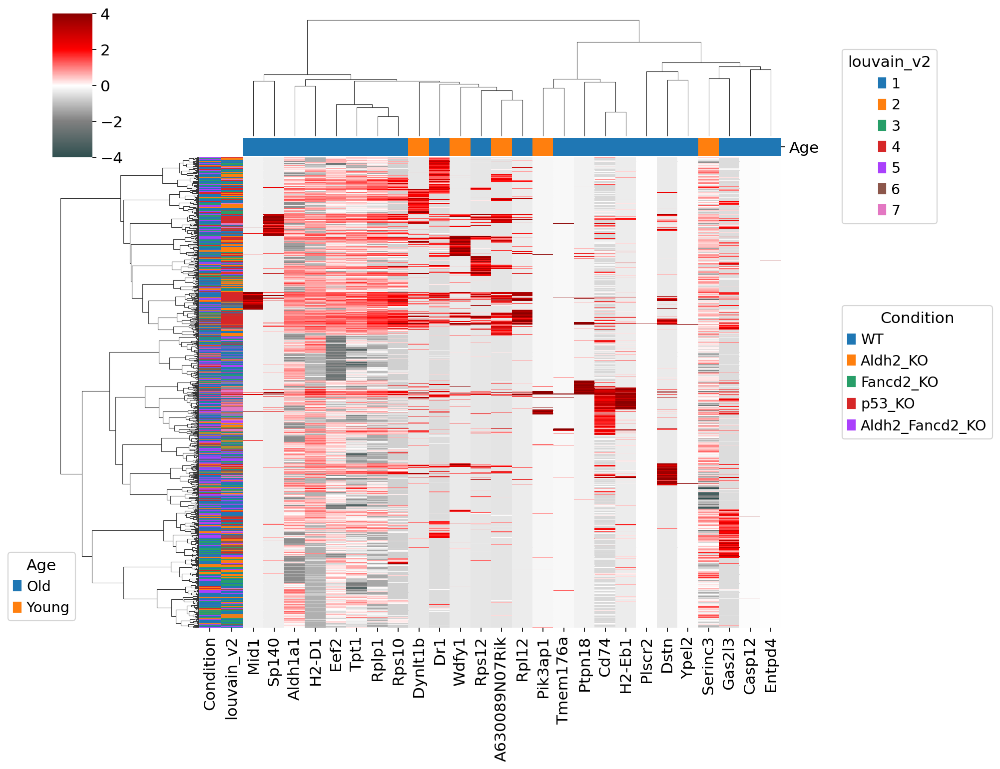

In [72]:
row_colors1 = adata.obs['Cond1'].astype('category')
row_colors1.name = 'Condition'
row_cat1 = list(row_colors1.cat.categories)
row_col1 = sc.pl.palettes.vega_20_scanpy[0:len(row_colors1.cat.categories)]
my_palette1 = dict(zip(row_colors1.cat.categories, row_col1))
row_colors1 = row_colors1.map(my_palette1).values.astype('category')

row_colors2 = adata.obs['louvain_v2'].astype('category')
row_colors2.name = 'louvain_v2'
row_cat2 = list(row_colors2.cat.categories)
row_col2 = sc.pl.palettes.vega_20_scanpy[0:len(row_colors2.cat.categories)]
my_palette2 = dict(zip(row_colors2.cat.categories, row_col2))
row_colors2 = row_colors2.map(my_palette2).values.astype('category')

row_colors = pd.DataFrame(np.vstack([row_colors1,row_colors2]).T)
row_colors.columns = ['Condition', 'louvain_v2']
row_colors.index = adata.obs_names

col_colors = yoGL['Age'].astype('category')
col_colors.name = 'Age'
col_cat = list(col_colors.cat.categories)
col_col = sc.pl.palettes.vega_20_scanpy[0:len(col_colors.cat.categories)]
my_palette = dict(zip(col_colors.cat.categories, col_col))
col_colors = col_colors.map(my_palette).values.astype('category')
col_colors = pd.DataFrame(np.array(col_colors))
col_colors.columns = ['Age']
col_colors.index = yoGL['GN']

cmap1 = LinearSegmentedColormap.from_list(name='heatmap_cmap', colors=['#2f4f4f', 'grey', 'white', 'red','#8b0000'])

import matplotlib.patches as mpatches
legend_TN = []
for i in range(len(row_cat1)):
    legend_TN.append(mpatches.Patch(color=row_col1[i], label=row_cat1[i]))
    
legend_TN1 = []
for i in range(len(row_cat2)):
    legend_TN1.append(mpatches.Patch(color=row_col2[i], label=row_cat2[i]))

legend_TN2 = []
for i in range(len(col_cat)):
    legend_TN2.append(mpatches.Patch(color=col_col[i], label=col_cat[i]))
    
g = sns.clustermap(D_sub, row_linkage=h2, col_linkage=h1, cmap=cmap1,yticklabels=False, xticklabels=True, row_colors=row_colors, col_colors=col_colors)
g.ax_heatmap.set_ylabel("")
g.ax_heatmap.set_xlabel("")

l1=g.ax_heatmap.legend(title='Condition', loc='upper left',bbox_to_anchor=(1.1,0.7),handles=legend_TN,frameon=True)
l2=g.ax_col_dendrogram.legend(title='louvain_v2', loc='center left',bbox_to_anchor=(1.1,0),handles=legend_TN1,frameon=True)
l3=g.ax_row_dendrogram.legend(title='Age', loc='lower right',bbox_to_anchor=(0.2,0),handles=legend_TN2,frameon=True)

Again, the number of gene union is too small. Need to think of another way doing this.

# Differential expression analysis

First find marker genes for each cluster.

In [90]:
adata = sc.read('./write/patel_smq2_EryA_processed_regressout_cellcycle.h5ad')

In [91]:
sc.tl.rank_genes_groups(adata, 'louvain_v2', n_genes=adata.raw.shape[1], key_added='DE_louvain_v2')

ranking genes
    finished: added to `.uns['DE_louvain_v2']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


In [92]:
pd.DataFrame(adata.uns['DE_louvain_v2']['names']).head(5)

,1,2,3,4,5,6
0,Cenpa,Ubb,Itga4,Mxd3,Pabpc1,C1qc
1,Aqp1,Lpin2,Pkhd1l1,Hist1h2af,Ubb,C1qb
2,Ccnb2,Eif5,St3gal6,Hist1h2bn,Bpgm,Apoe
3,Hist1h2bc,Pabpc1,Emilin2,Hist1h3c,Specc1,Tmsb4x
4,Lockd,Tmem131l,Nxpe2,Hist1h3b,Gm26526,Vcam1


cluster:  1
(1152, 7536)
(1152, 19025)
upRegulated gene: 64
downRegulated gene: 32


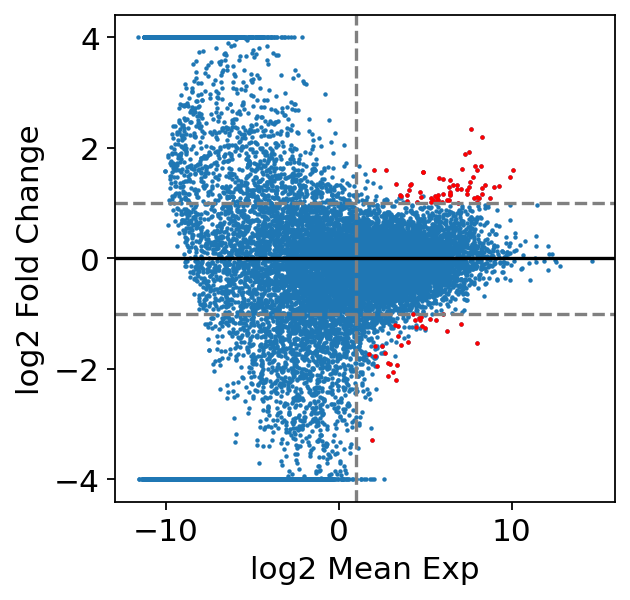

cluster:  2
(1152, 7536)
(1152, 19025)
upRegulated gene: 35
downRegulated gene: 357


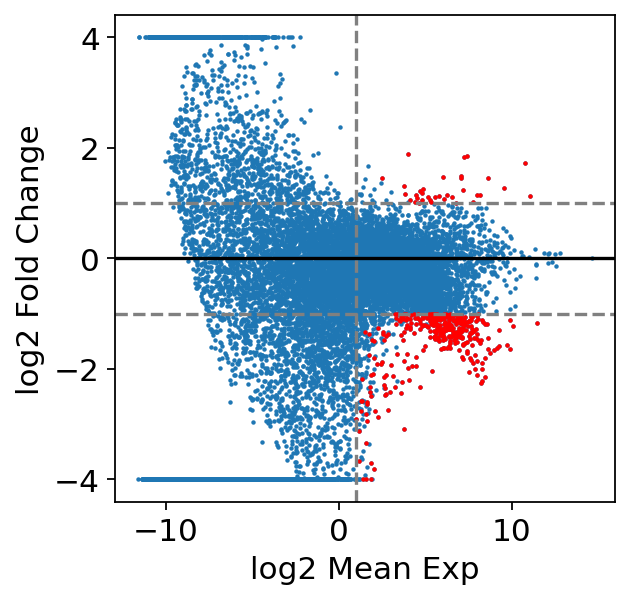

cluster:  3
(1152, 7536)
(1152, 19025)
upRegulated gene: 678
downRegulated gene: 56


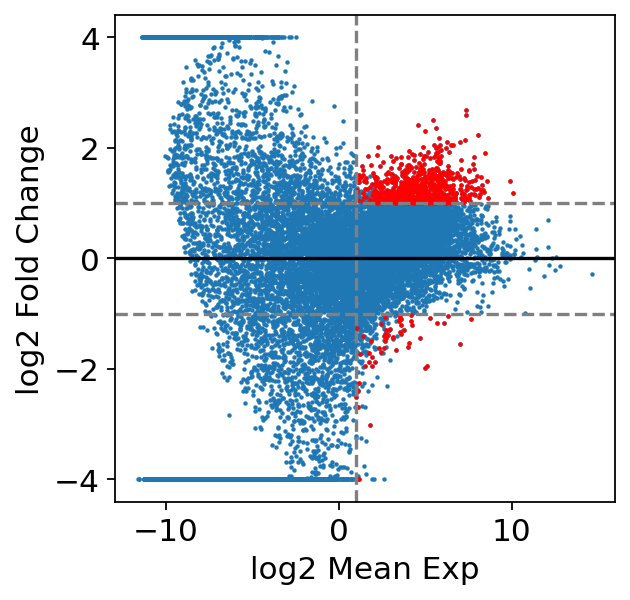

cluster:  4
(1152, 7536)
(1152, 19025)
upRegulated gene: 1901
downRegulated gene: 419


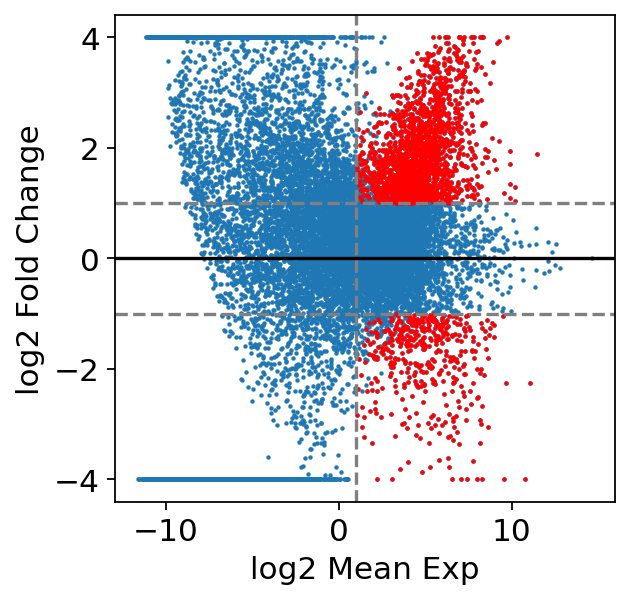

cluster:  5
(1152, 7536)
(1152, 19025)
upRegulated gene: 98
downRegulated gene: 2292


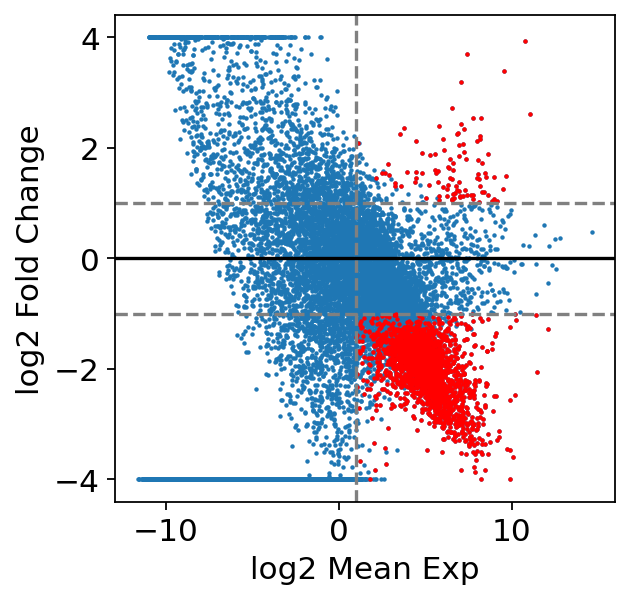

cluster:  6
(1152, 7536)
(1152, 19025)
upRegulated gene: 156
downRegulated gene: 4


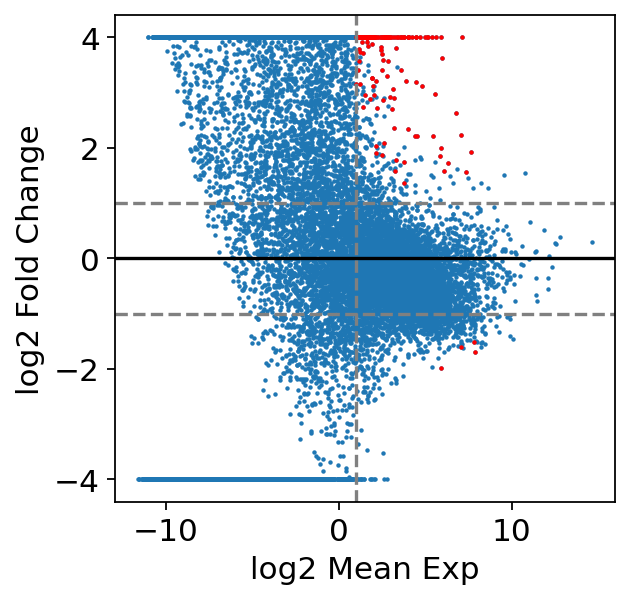

In [93]:
for x in adata.obs['louvain_v2'].cat.categories:
    print('cluster: ', str(x))
    upG, downG, tableG = smqpp.plot_ma(adata, 'DE_louvain_v2', cidx=int(x)-1, padj_cutoff=0.1, logFC_cutoff=1, exp_cutoff=1)
    np.savetxt('DEres/EryA_louvain_v2/c'+x+'vsAll_upG.txt', upG, delimiter='\t', fmt='%s')
    np.savetxt('DEres/EryA_louvain_v2/c'+x+'vsAll_downG.txt', downG, delimiter='\t', fmt='%s')
    tableG.to_csv('DEres/EryA_louvain_v2/c'+x+'vsAll_table.csv')

In [97]:
from os import listdir
from os.path import isfile, join
import re

ntop = 5
glabel = adata.obs['louvain_v2'].cat.categories
gpos = [(ntop*x, ntop*(x+1)-1) for x in range(len(glabel))]
Con_dir = './DEres/EryA_louvain_v2/'
onlyfiles = ['c'+x+'vsAll_upG.txt' for x in glabel]
print(onlyfiles)
geneDEtop = np.concatenate([pd.read_csv(Con_dir+f, header=None).iloc[0:ntop,:].values.flatten() for f in onlyfiles])

['c1vsAll_upG.txt', 'c2vsAll_upG.txt', 'c3vsAll_upG.txt', 'c4vsAll_upG.txt', 'c5vsAll_upG.txt', 'c6vsAll_upG.txt']


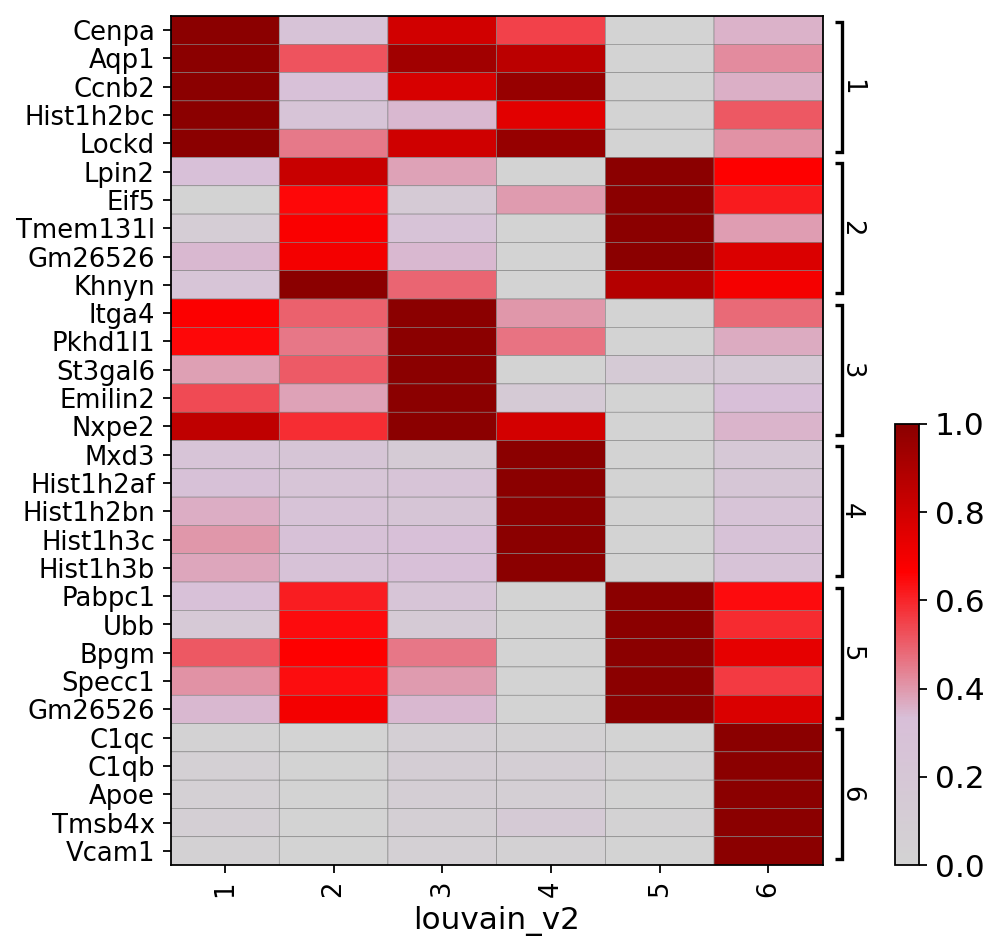

GridSpec(2, 3, height_ratios=[0, 7], width_ratios=[5.4, 0.4, 0.2])

In [98]:
from matplotlib.colors import LinearSegmentedColormap
cmap = LinearSegmentedColormap.from_list(name='gene_cmap', colors=['lightgrey', 'thistle', 'red', 'darkred']) 

sc.pl.matrixplot(adata, geneDEtop, groupby = 'louvain_v2', 
                 dendrogram=False, swap_axes=True, standard_scale='var', cmap=cmap,
                var_group_positions = gpos,
                var_group_labels=glabel, figsize=(6,7))

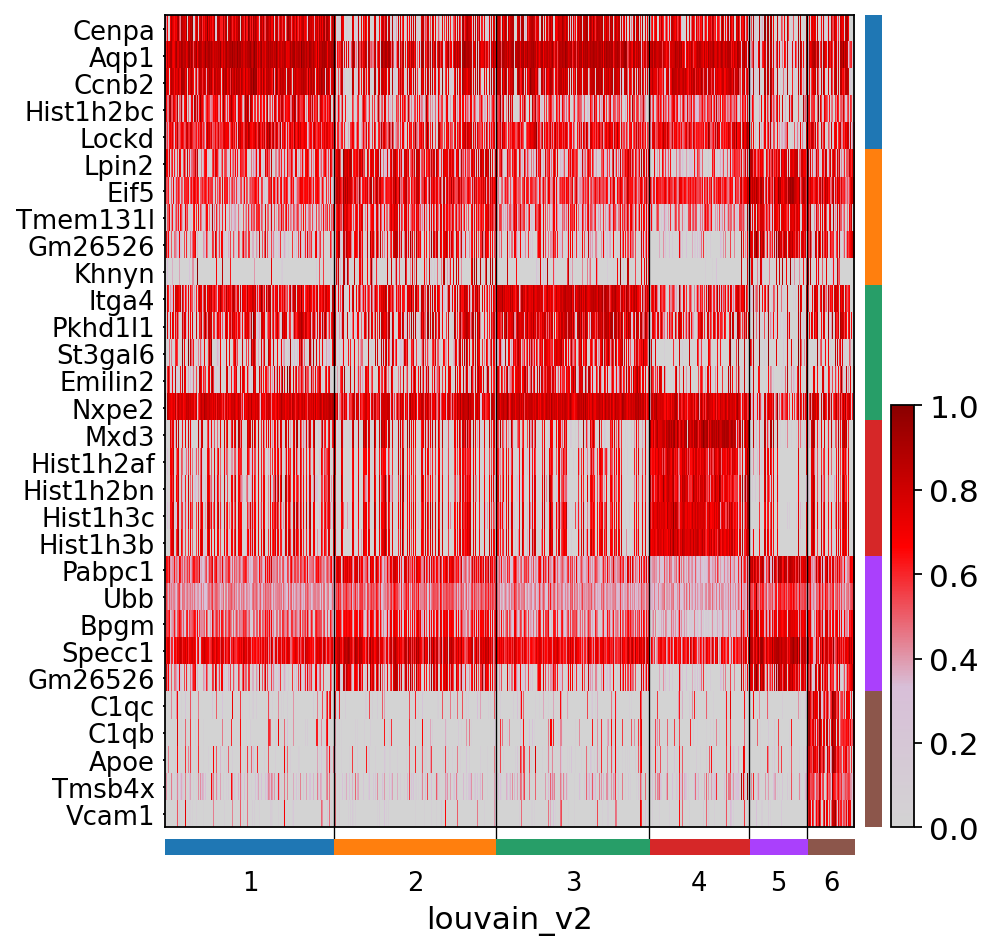

GridSpec(3, 3, height_ratios=[0, 6.87, 0.13], width_ratios=[6, 0.14, 0.2])

In [99]:
sc.pl.heatmap(adata, geneDEtop, groupby = 'louvain_v2', 
                 dendrogram=False, swap_axes=True, standard_scale='var', cmap=cmap,
                var_group_positions = gpos,
                var_group_labels=glabel,figsize=(6,7),show_gene_labels=True)

Then find marker genes for each condition.

In [100]:
sc.tl.rank_genes_groups(adata, 'Cond1', n_genes=adata.raw.shape[1], key_added='DE_Condition')

ranking genes
    finished: added to `.uns['DE_Condition']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


In [101]:
pd.DataFrame(adata.uns['DE_Condition']['names']).head(5)

,WT,Aldh2_KO,Fancd2_KO,p53_KO,Aldh2_Fancd2_KO
0,Xist,Eif2s3y,Gpx1,Snca,Cdkn1a
1,Hist1h4m,Ddx3y,Eif2s3y,Ifi27,Apol11b
2,Gm42418,Lipe,Hist1h1e,Isg15,Gm42047
3,Spta1,Uty,Ubald2,Trp53,Tjp1
4,Gpc4,Ngp,Uty,Xist,Utrn


Condition: WT
(1152, 7536)
(1152, 19025)
upRegulated gene: 9
downRegulated gene: 14


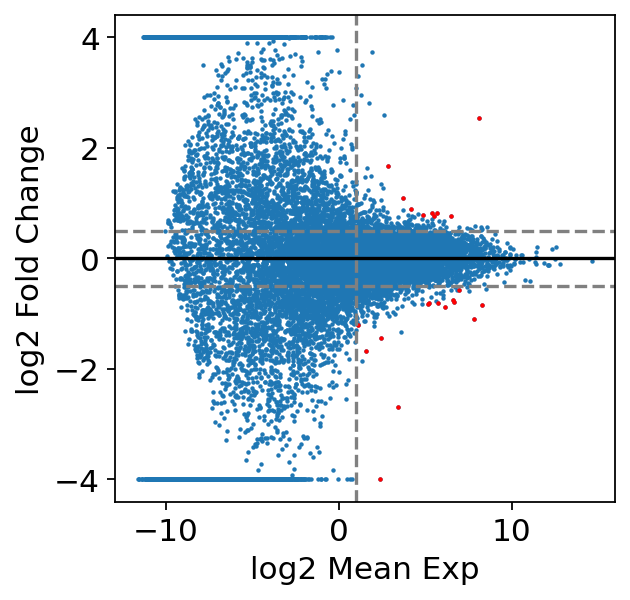

Condition: Aldh2_KO
(1152, 7536)
(1152, 19025)
upRegulated gene: 1
downRegulated gene: 4


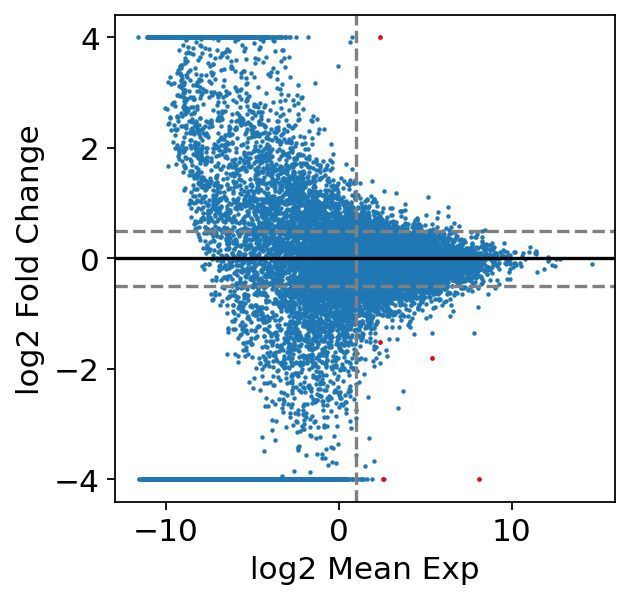

Condition: Fancd2_KO
(1152, 7536)
(1152, 19025)
upRegulated gene: 0
downRegulated gene: 2


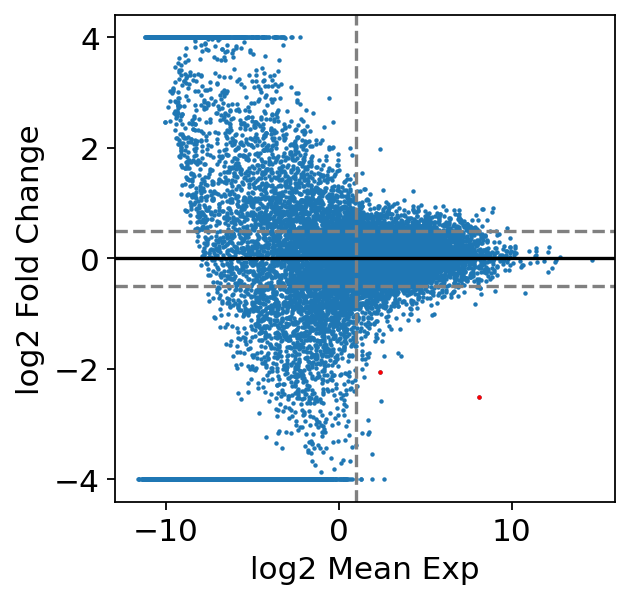

Condition: p53_KO
(1152, 7536)
(1152, 19025)
upRegulated gene: 1
downRegulated gene: 0


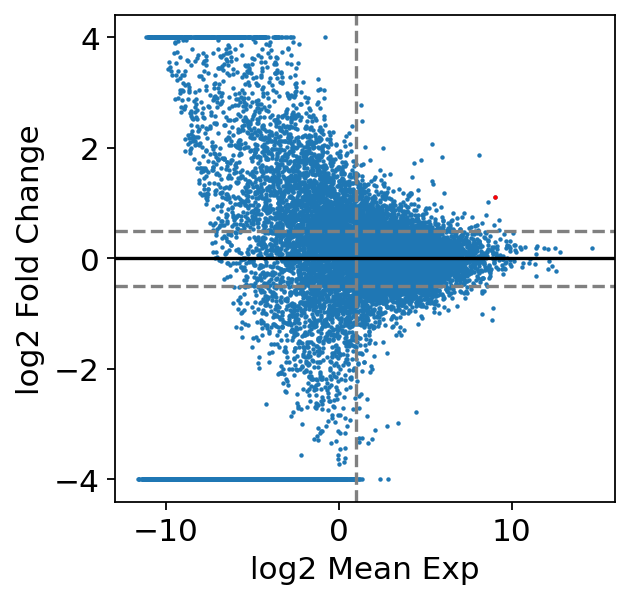

Condition: Aldh2_Fancd2_KO
(1152, 7536)
(1152, 19025)
upRegulated gene: 11
downRegulated gene: 13


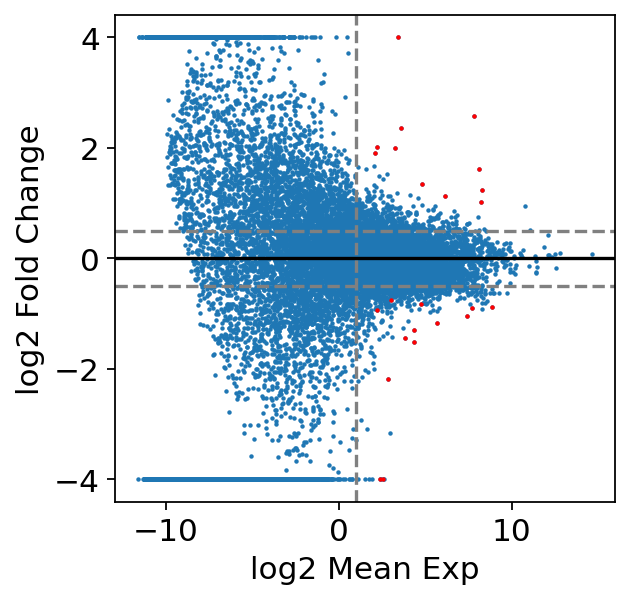

In [102]:
Condition_cat = adata.obs['Cond1'].cat.categories
Condition_cat = [x.replace(' ', '_').replace('/', '_') for x in Condition_cat]
for x in range(len(Condition_cat)):
    print('Condition: '+Condition_cat[x])
    upG, downG, tableG = smqpp.plot_ma(adata, 'DE_Condition',cidx=int(x), padj_cutoff=0.1, logFC_cutoff=0.5, exp_cutoff=1)
    np.savetxt('DEres/EryA_Condition/'+Condition_cat[x]+'vsAll_upG.txt', upG, delimiter='\t', fmt='%s')
    np.savetxt('DEres/EryA_Condition/'+Condition_cat[x]+'vsAll_downG.txt', downG, delimiter='\t', fmt='%s')
    tableG.to_csv('DEres/EryA_Condition/'+Condition_cat[x]+'vsAll_table.csv')

As all conditions behave similarly, there is no need for plotting out the results.

In [104]:
adata.write('./write/patel_smq2_EryA_processed_regressout_cellcycle.h5ad')